# Module 2.1: Converting Rotational Motion to Linear Motion!

Module 2 explores linear motion. You will focus on two mechanisms to convert rotational motion to linear motion and then use one to construct a LEGO elevator.

## Different Types of Motion:

#### Rotational Motion:

Rotational motion is defined as motion where a body moves around an axis. Examples of rotational motion include a wheel spinning on an axle or the earth rotating about its axis. This is the type of motion that we've worked with so far, as motors produce rotational motion.

#### Oscillatory Motion:

Oscillatory Motion is defined as motion where a body moves back and forth about a mean point. The most clear example of oscillatory motion is a pendulum, but the ocean's tides and vibrating guitar strings also exhibit oscillatory motion.

#### Linear Motion:

Linear Motion is defined as motion where a body moves along a straight line. Examples of linear motion include the movement of sliding doors and the firing of a bullet, as well as the free fall of any object. Linear motion can be produced by linear actuators or created using a different type of motion. 

## Converting between Rotational Motion and Linear Motion:

Because we only have access to motors, we need to know how to convert rotational motion into linear motion in order to design our elevator. While there are many ways to do so, we will focus on two different mechanisms.

### The Slider Crank Mechanism:
<div>
 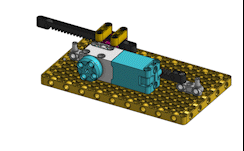
</div>

### The Rack & Pinion Mechanism:
<div>
 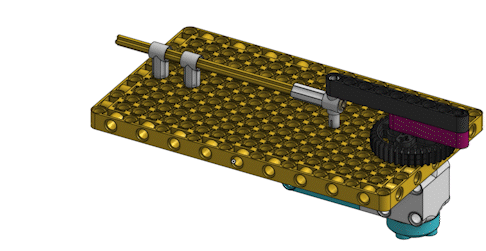
</div>

Construct each of these mechanisms and connect the motor to port D. Control using the buttons below. You do not need to read or understand the code cell, just press Shift+Enter to run the code.

In [13]:
import serial
import sys
import glob
import time
import serial.tools.list_ports
import ipywidgets as widgets
from ipywidgets import Layout
from IPython.display import display
from IPython.core.display import HTML
from IPython.display import clear_output


ser = None

def serial_ports():
     result = []
     ports = serial.tools.list_ports.comports()
     for port, desc, hwid in sorted(ports):
          comm =  "{}: {}".format(port, desc)
          result.append(comm) 
     return result

def InitSerial(port, bps = 9600, to = 0):
    global ser
    try:
        ser = serial.Serial(port, bps, timeout = to)  # open serial port
        ser.flushInput()
        ser.flushOutput()
        return ser.name
    except Exception as e:
        return 'ERR: ' + str(e)

def CloseSerial():
    return('done')
    try:
        ser.flush()
        ser.close()
        return 'done'
    except Exception as e:
        return 'ERR: ' + str(e)    

def WriteSerial(string):
    try:
        reply = ser.write(string.encode())
        return str(reply)
    except Exception as e:
        return 'ERR: ' + str(e)    

def ReadSerial():
    try:
        reply = ''
        while ser.in_waiting:
            reply = reply + ser.readline().decode()
        return reply
    except Exception as e:
        return 'ERR: ' +  str(e)
    
def SendRead(string):
    if WriteSerial(string):
        time.sleep(0.1)
        return ReadSerial()
    
updatedPortList = []

def search_for_ports():
#     updatedPortList = []
    serialPortList = serial_ports()
    for x in serialPortList:
        updatedPortList.append(x[:x.index(':')])
        
def on_value_change(change):
    with output2:
        InitSerial(change['new'],115200)
        WriteSerial('\x03')
        run_some_code()
        
def run_some_code():
    connectCode = '''
import hub,utime
battery.info()
    '''
    motorTest = '''
import hub,utime
hub.port.D.info()
    '''
    WriteSerial('\x05')
    WriteSerial(connectCode)
    WriteSerial('\x04')
    WriteSerial('\x03')
    
    time.sleep(1) #wait for everything to get over there and read all the replies
    words = ReadSerial()
#     print(words)
    if (">>>" in words):
        WriteSerial('\x05')
        WriteSerial(motorTest)
        WriteSerial('\x04')
        time.sleep(1) #wait for everything to get over there and read all the replies
        motorwords = ReadSerial()
#         print (motorwords)
        if ('{\'type\': None}' not in motorwords):
            print("You are now connected to SPIKE Prime!")
        else:
            print("Error, are you sure the motor is plugged in to port D?")    
    else:
        print("Error, try reconnecting or connecting to a different serial port.")

updatedPortList = []
search_for_ports()
dropdown = widgets.Select(
            options=updatedPortList,
            description='Select Port:',
            disabled=False)
output2 = widgets.Output()
display(dropdown, output2)
dropdown.observe(on_value_change, names='value')
# note if the timeout is anything but zero it is slow
def forward_Speed (b):
    with goFaster:
        goForward = '''hub.port.D.motor.pwm(50)
'''
        WriteSerial('\x05')
        WriteSerial(goForward)
        WriteSerial('\x04')
def backward_Speed (b):
    with goSlower:
        goBackward = '''hub.port.D.motor.pwm(-50)
'''
        WriteSerial('\x05')
        WriteSerial(goBackward)
        WriteSerial('\x04')
def break_Speed(b):
    with stop:
        stopSpeed = '''hub.port.D.motor.brake()
'''
        WriteSerial('\x05')
        WriteSerial(stopSpeed)
        WriteSerial('\x04')

setModes = '''
import hub,utime
hub.port.D.motor.mode(1)
hub.port.D.motor.brake()
'''
WriteSerial('\x05')
WriteSerial(setModes)
WriteSerial('\x04')

forwardButton = widgets.Button(
    disabled=False,
    layout = Layout(height = '40px',width = '40px',margin = '0px 0px 0px 0px',padding = '0px 0px 0px 0px'),
    icon='arrow-up' # (FontAwesome names without the `fa-` prefix)
)

goFaster = widgets.Output()
backwardButton = widgets.Button(
    disabled=False,
    layout = forwardButton.layout,
    icon='arrow-down' # (FontAwesome names without the `fa-` prefix)
)
goSlower = widgets.Output()
breakButton = widgets.Button(
    disabled=False,
    layout = forwardButton.layout,
    icon='stop' # (FontAwesome names without the `fa-` prefix)
)

stop = widgets.Output()

display(forwardButton,goFaster)
display(breakButton,stop)
display(backwardButton,goSlower)
forwardButton.on_click(forward_Speed)
breakButton.on_click(break_Speed)
backwardButton.on_click(backward_Speed)

Select(description='Select Port:', options=('/dev/cu.Bluetooth-Incoming-Port', '/dev/cu.LEGOHub30E283048E8E', …

Output()

Button(icon='arrow-up', layout=Layout(height='40px', margin='0px 0px 0px 0px', padding='0px 0px 0px 0px', widt…

Output()

Button(icon='stop', layout=Layout(height='40px', margin='0px 0px 0px 0px', padding='0px 0px 0px 0px', width='4…

Output()

Button(icon='arrow-down', layout=Layout(height='40px', margin='0px 0px 0px 0px', padding='0px 0px 0px 0px', wi…

Output()

Consider the pros and cons of each of these mechanisms. What unique purposes would the Slider Crank Mechanism sever? What about the Rack and Pinion Mechanism? How could you adjust the two mechanisms to generate a larger range of motion? Can you think of any alternative mechanisms for converting rotational motion into linear motion?

Once you feel you sufficiently understand the two mechanisms, you are ready to move on to the next section.